<a href="https://colab.research.google.com/github/roscoekerby/FREE-OpenCV-Bootcamp/blob/main/Copy_of_09_panorama.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Creating Panoramas using OpenCV

**Satya Mallick, LearnOpenCV.com**

In [ ]:
# Import Libraries
import os
import cv2
import math
import glob
import numpy as np
import matplotlib.pyplot as plt

from zipfile import ZipFile
from urllib.request import urlretrieve

%matplotlib inline

##  <font style="color:black">Download Assets</font>

In [ ]:
def download_and_unzip(url, save_path):
    print(f"Downloading and extracting assests....", end="")

    # Downloading zip file using urllib package.
    urlretrieve(url, save_path)

    try:
        # Extracting zip file using the zipfile package.
        with ZipFile(save_path) as z:
            # Extract ZIP file contents in the same directory.
            z.extractall(os.path.split(save_path)[0])

        print("Done")

    except Exception as e:
        print("\nInvalid file.", e)

In [ ]:
URL = r"https://www.dropbox.com/s/0o5yqql1ynx31bi/opencv_bootcamp_assets_NB9.zip?dl=1"

asset_zip_path = os.path.join(os.getcwd(), "opencv_bootcamp_assets_NB9.zip")

# Download if assest ZIP does not exists.
if not os.path.exists(asset_zip_path):
    download_and_unzip(URL, asset_zip_path)

# Steps for Creating Panoramas

1. Find keypoints in all images
2. Find pairwise correspondences
2. Estimate pairwise Homographies
3. Refine Homographies
3. Stitch with Blending

# Steps for Creating Panoramas using OpenCV

In [ ]:
# Read Images

imagefiles = glob.glob(f"boat{os.sep}*")
imagefiles.sort()


images = []
for filename in imagefiles:
    img = cv2.imread(filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img)

num_images = len(images)

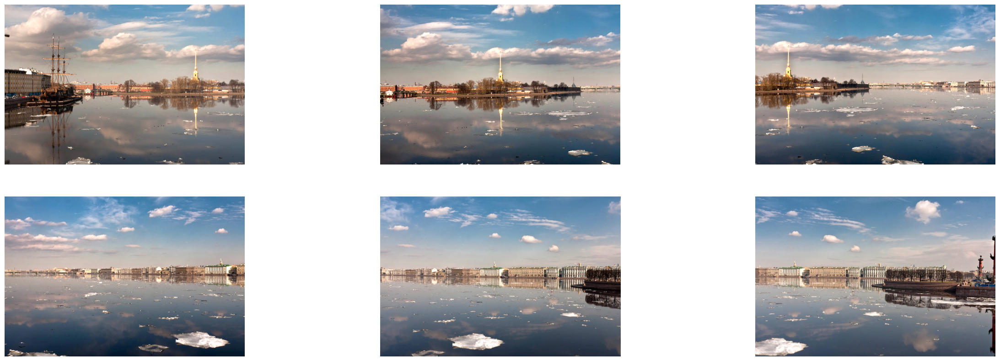

In [ ]:
# Display Images
plt.figure(figsize=[30, 10])
num_cols = 3
num_rows = math.ceil(num_images / num_cols)
for i in range(0, num_images):
    plt.subplot(num_rows, num_cols, i + 1)
    plt.axis("off")
    plt.imshow(images[i])

Use the **sticher** class

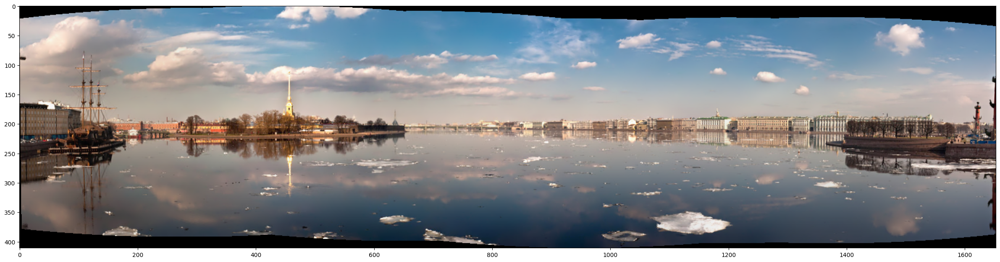

In [ ]:
# Stitch Images
stitcher = cv2.Stitcher_create()
status, result = stitcher.stitch(images)

if status == 0:
    plt.figure(figsize=[30, 10])
    plt.imshow(result)

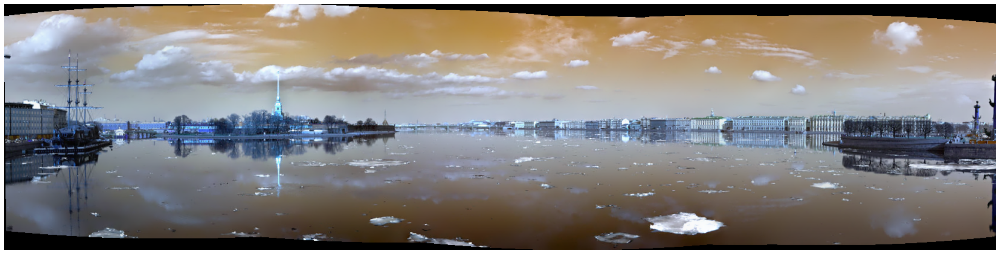

In [ ]:
# **
import cv2
import matplotlib.pyplot as plt

# Load images
images = [cv2.imread(image_path) for image_path in imagefiles]

# Create a stitcher object with cylindrical projection
stitcher = cv2.Stitcher_create(cv2.Stitcher_PANORAMA)

# Perform the stitching
status, result = stitcher.stitch(images)

# Check if the stitching succeeded
if status == cv2.Stitcher_OK:
    plt.figure(figsize=(30, 10))
    plt.imshow(result)
    plt.axis('off')
    plt.show()
else:
    print(f"Error during stitching: {status}")


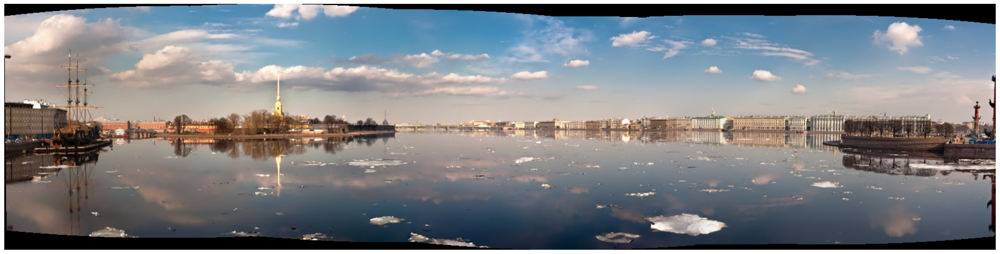

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def crop_black_edges(image):
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Threshold the grayscale image to create a binary mask
    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

    # Find the contours of the white areas in the mask
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Get the bounding box of the largest contour
    if contours:
        x, y, w, h = cv2.boundingRect(contours[0])
        cropped_image = image[y:y+h, x:x+w]
        return cropped_image
    else:
        return image

# Load images
images = [cv2.imread(image_path) for image_path in imagefiles]

# Create a stitcher object
stitcher = cv2.Stitcher_create(cv2.Stitcher_PANORAMA)

# Perform the stitching
status, result = stitcher.stitch(images)

# Check if the stitching succeeded
if status == cv2.Stitcher_OK:
    # Crop the black edges from the stitched image
    cropped_result = crop_black_edges(result)

    # Display the result
    plt.figure(figsize=(30, 10))
    plt.imshow(cv2.cvtColor(cropped_result, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
else:
    print(f"Error during stitching: {status}")


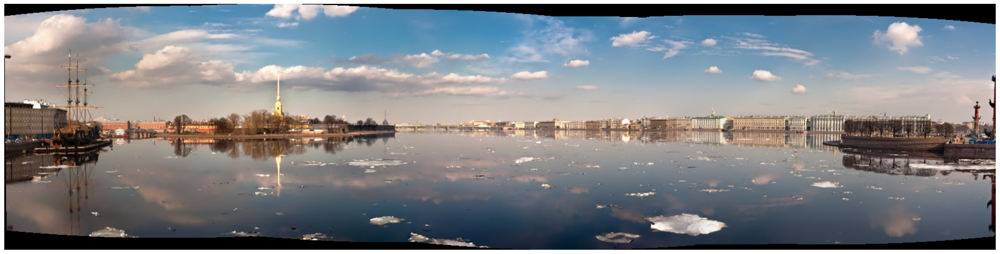

True

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the stitched image
image_path = cropped_result
# stitched_image = cv2.imread(image_path)
stitched_image = cropped_result

def crop_black_edges(image):
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Threshold the grayscale image to create a binary mask
    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

    # Find the contours of the white areas in the mask
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Get the bounding box of the largest contour
    if contours:
        x, y, w, h = cv2.boundingRect(contours[0])
        cropped_image = image[y:y+h, x:x+w]
        return cropped_image
    else:
        return image

# Crop the black edges from the stitched image
cropped_result = crop_black_edges(stitched_image)

# Display the result
plt.figure(figsize=(30, 10))
plt.imshow(cv2.cvtColor(cropped_result, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# Save the result
output_path = "cropped_result.png"
cv2.imwrite(output_path, cropped_result)


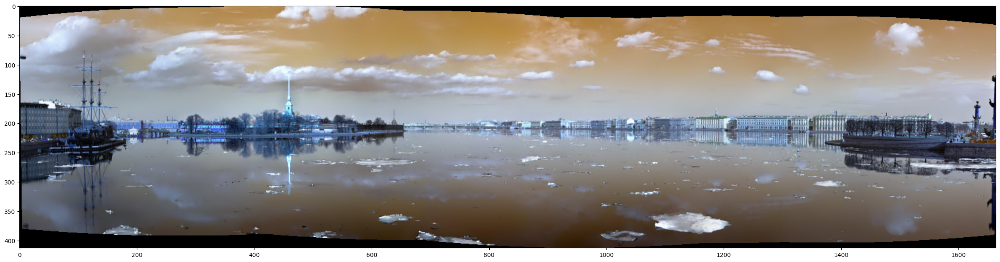

In [ ]:
import cv2
import matplotlib.pyplot as plt

def crop_black_pixels(stitched_image):
  """
  Dynamically crops black pixels from a stitched image using OpenCV.

  Args:
      stitched_image: The stitched image as a NumPy array.

  Returns:
      A NumPy array containing the cropped image.
  """

  # Convert to grayscale for thresholding
  gray = cv2.cvtColor(stitched_image, cv2.COLOR_BGR2GRAY)

  # Apply adaptive thresholding for better black area detection
  # thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
  #                                cv2.THRESH_BINARY, 11, 2)

  thresh = cv2.adaptiveThreshold(gray, 150, cv2.ADAPTIVE_THRESH_MEAN_C,
                                 cv2.THRESH_BINARY, 11, 2)


  # Find contours of non-black areas
  contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  # Find the largest contour (assuming the stitched image is mostly content)
  largest_contour = max(contours, key=cv2.contourArea)

  # Get bounding rectangle of the largest contour
  x, y, w, h = cv2.boundingRect(largest_contour)

  # Crop the stitched image using the bounding rectangle
  cropped_image = stitched_image[y:y+h, x:x+w]

  return cropped_image

# Stitch your images using stitcher.stitch(...) as you normally would
stitcher = cv2.Stitcher_create()
status, result = stitcher.stitch(images)

if status == 0:
  # Crop black pixels
  cropped_result = crop_black_pixels(result.copy())

  # Display the cropped stitched image
  plt.figure(figsize=[30, 10])
  plt.imshow(cropped_result)
  plt.show()


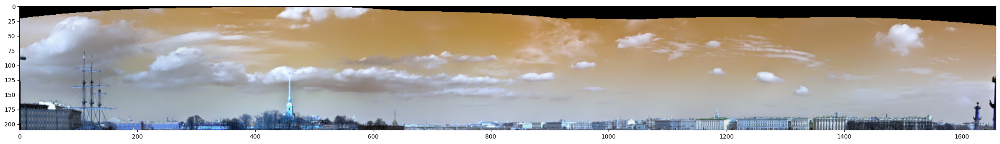

In [ ]:
import cv2
import matplotlib.pyplot as plt

def crop_black_pixels(stitched_image):
  """
  Dynamically crops black pixels from a stitched image using OpenCV,
  including options for more aggressive thresholding and morphological operations.

  Args:
      stitched_image: The stitched image as a NumPy array.

  Returns:
      A NumPy array containing the cropped image.
  """

  # Convert to grayscale for thresholding
  gray = cv2.cvtColor(stitched_image, cv2.COLOR_BGR2GRAY)

  # Choose one of the following thresholding methods:
  # Option 1: More aggressive thresholding (adjust threshold value)
  # thresh = cv2.adaptiveThreshold(gray, 240, cv2.ADAPTIVE_THRESH_MEAN_C,
  #                                cv2.THRESH_BINARY, 11, 2)

  # Option 2: Adaptive thresholding with morphological opening
  kernel = np.ones((3, 3), np.uint8)  # Define a small kernel
  thresh = cv2.adaptiveThreshold(gray, 150, cv2.ADAPTIVE_THRESH_MEAN_C,
                                 cv2.THRESH_BINARY, 11, 2)
  thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)

  # Option 3: Color-based thresholding (adjust color ranges)
  # hsv = cv2.cvtColor(stitched_image, cv2.COLOR_BGR2HSV)
  # lower_red = np.array([160, 40, 40])
  # upper_red = np.array([180, 255, 255])
  # mask = cv2.inRange(hsv, lower_red, upper_red)
  # mask = cv2.bitwise_not(mask)
  # thresh = cv2.bitwise_and(gray, gray, mask=mask)

  # Find contours of non-black areas
  contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  # Find the largest contour (assuming the stitched image is mostly content)
  largest_contour = max(contours, key=cv2.contourArea)

  # Get bounding rectangle of the largest contour
  x, y, w, h = cv2.boundingRect(largest_contour)

  # Crop the stitched image using the bounding rectangle
  cropped_image = stitched_image[y:y+h, x:x+w]

  return cropped_image

# Stitch your images using stitcher.stitch(...) as you normally would
stitcher = cv2.Stitcher_create()
status, result = stitcher.stitch(images)

if status == 0:
  # Crop black pixels
  cropped_result = crop_black_pixels(result.copy())

  # Display the cropped stitched image
  plt.figure(figsize=[30, 10])
  plt.imshow(cropped_result)
  plt.show()


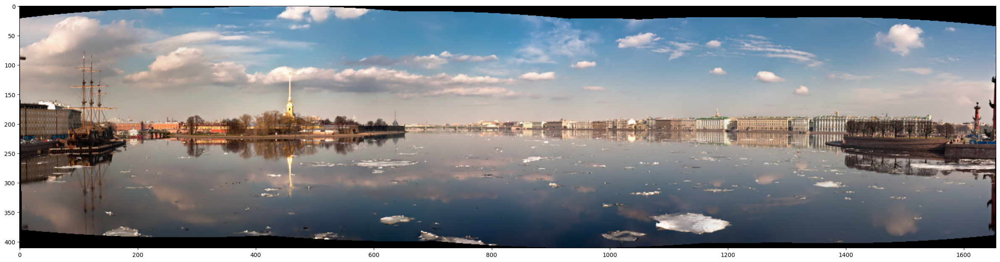

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def crop_black_pixels(stitched_image):
    """
    Dynamically crops black pixels from a stitched image using OpenCV,
    including options for more aggressive thresholding and morphological operations.

    Args:
        stitched_image: The stitched image as a NumPy array.

    Returns:
        A NumPy array containing the cropped image.
    """

    # Convert to grayscale for thresholding
    gray = cv2.cvtColor(stitched_image, cv2.COLOR_BGR2GRAY)

    # Option 2: Adaptive thresholding with morphological opening
    kernel = np.ones((3, 3), np.uint8)  # Define a small kernel
    thresh = cv2.adaptiveThreshold(gray, 150, cv2.ADAPTIVE_THRESH_MEAN_C,
                                   cv2.THRESH_BINARY, 11, 2)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)

    # Invert the threshold image
    thresh = cv2.bitwise_not(thresh)

    # Find contours of non-black areas
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Find the largest contour (assuming the stitched image is mostly content)
    largest_contour = max(contours, key=cv2.contourArea)

    # Get bounding rectangle of the largest contour
    x, y, w, h = cv2.boundingRect(largest_contour)

    # Crop the stitched image using the bounding rectangle
    cropped_image = stitched_image[y:y+h, x:x+w]

    return cropped_image

# Load the image
# Stitch your images using stitcher.stitch(...) as you normally would
stitcher = cv2.Stitcher_create()
status, result = stitcher.stitch(images)

# Crop black pixels
cropped_result = crop_black_pixels(result.copy())

# Display the cropped stitched image
plt.figure(figsize=[30, 10])
plt.imshow(cv2.cvtColor(cropped_result, cv2.COLOR_BGR2RGB))
plt.show()


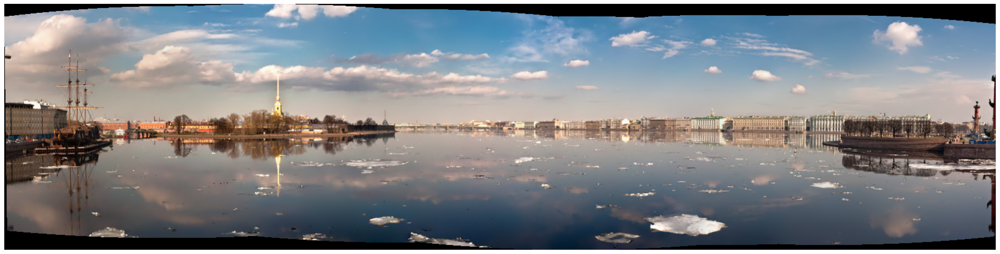

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def crop_black_pixels(stitched_image):
    """
    Dynamically crops black pixels from a stitched image using OpenCV.

    Args:
        stitched_image: The stitched image as a NumPy array.

    Returns:
        A NumPy array containing the cropped image.
    """
    # Convert to grayscale
    gray = cv2.cvtColor(stitched_image, cv2.COLOR_BGR2GRAY)

    # Threshold the image to create a binary image where black pixels are 0 and everything else is 1
    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

    # Find contours of the non-black areas
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Get bounding box of the largest contour
    x, y, w, h = cv2.boundingRect(contours[0])
    for contour in contours:
        x_, y_, w_, h_ = cv2.boundingRect(contour)
        x = min(x, x_)
        y = min(y, y_)
        w = max(x+w, x_+w_) - x
        h = max(y+h, y_+h_) - y

    # Crop the image using the bounding box
    cropped_image = stitched_image[y:y+h, x:x+w]

    return cropped_image

# Load the image
stitcher = cv2.Stitcher_create()
status, result = stitcher.stitch(images)
stitched_image = result

# Crop black pixels
cropped_result = crop_black_pixels(stitched_image.copy())

# Display the cropped stitched image
plt.figure(figsize=[30, 10])
plt.imshow(cv2.cvtColor(cropped_result, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


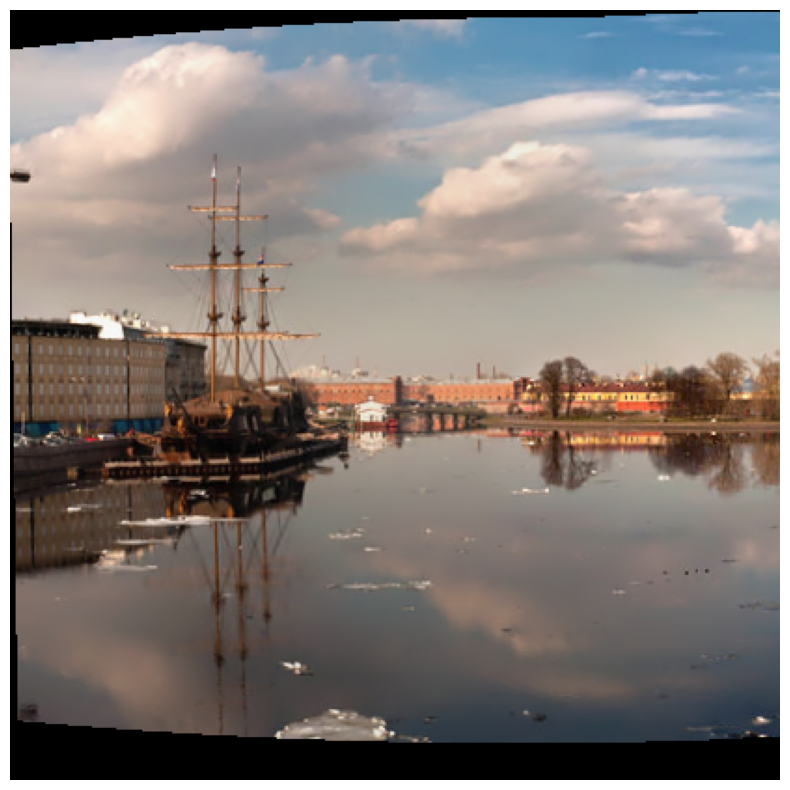

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def trim_black_edges(image):
    """
    Trims black edges from the image by scanning from the edges towards the center.

    Args:
        image: The input image as a NumPy array.

    Returns:
        A NumPy array containing the cropped image.
    """
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Find the coordinates of non-black pixels
    coords = np.column_stack(np.where(gray > 0))

    # Get the bounding box of non-black pixels
    x, y, w, h = cv2.boundingRect(coords)

    # Crop the image using the bounding box
    cropped_image = image[y:y+h, x:x+w]

    return cropped_image

# Load the image
stitcher = cv2.Stitcher_create()
status, result = stitcher.stitch(images)
stitched_image = result

# stitched_image = cv2.imread(image_path)

# Trim black edges
trimmed_result = trim_black_edges(stitched_image)

# Display the trimmed image
plt.figure(figsize=[30, 10])
plt.imshow(cv2.cvtColor(trimmed_result, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


In [ ]:
import cv2
import numpy as np

def crop_black_borders(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Create a binary mask where black pixels are 0 and others are 1
    _, binary_mask = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

    # Find contours in the binary image
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Get the bounding box of the largest contour
    x, y, w, h = cv2.boundingRect(contours[0])

    # Crop the image using the bounding box
    cropped_image = image[y:y+h, x:x+w]

    return cropped_image

# Load your image
image_path = '/content/cropped_result.png'
image = cv2.imread(image_path)

# Crop black borders
cropped_image = crop_black_borders(image)

# Save or display the cropped image
cv2.imwrite('cropped_image.jpg', cropped_image)
# To display the image use:
# cv2.imshow('Cropped Image', cropped_image)
# cv2.waitKey(0)
# cv2.destroyAllWindows()


True

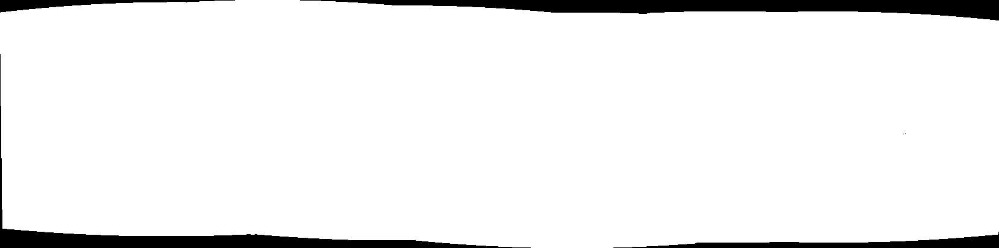

True

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def crop_black_borders(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Create a binary mask where black pixels are 0 and others are 1
    _, binary_mask = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

    # Display the binary mask
    cv2_imshow(binary_mask)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

    # Find contours in the binary image
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Get the bounding box of the largest contour
    if contours:
        x, y, w, h = cv2.boundingRect(contours[0])

        # Crop the image using the bounding box
        cropped_image = image[y:y+h, x:x+w]
        return cropped_image
    else:
        return image  # Return original image if no contours are found

# Load your image
image_path = '/content/cropped_result.png'
image = cv2.imread(image_path)

# Crop black borders
cropped_image = crop_black_borders(image)

# Save or display the cropped image
cv2.imwrite('cropped_image.jpg', cropped_image)
# To display the image use:
# cv2.imshow('Cropped Image', cropped_image)
# cv2.waitKey(0)
# cv2.destroyAllWindows()


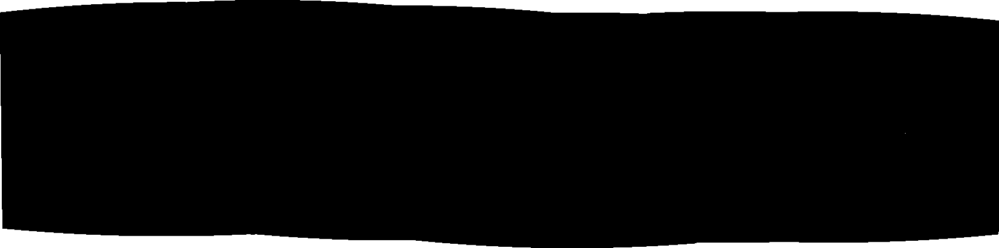

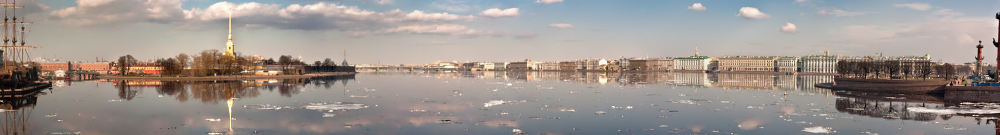

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def crop_black_borders(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Create a binary mask where black pixels are 0 and others are 255
    _, binary_mask = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY_INV)

    # Display the binary mask
    cv2_imshow(binary_mask)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

    # Find the coordinates of all black pixels
    black_pixels = np.where(binary_mask == 255)

    # Get the bounding box of the black pixels
    min_x = np.min(black_pixels[1])
    max_x = np.max(black_pixels[1])
    min_y = np.min(black_pixels[0])
    max_y = np.max(black_pixels[0])

    # Crop the image using the bounding box
    cropped_image = image[min_y+100:max_y-100, min_x+100:max_x+100]

    return cropped_image

# Load your image
image_path = '/content/cropped_result.png'
image = cv2.imread(image_path)

# Crop black borders
cropped_image = crop_black_borders(image)

# Save or display the cropped image
cv2.imwrite('cropped_image.jpg', cropped_image)
# To display the image use:
cv2_imshow(cropped_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [ ]:
import cv2
import numpy as np

def crop_black_borders(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Create a binary mask where black pixels are 0 and others are 255
    _, binary_mask = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

    # Get image dimensions
    height, width = binary_mask.shape

    # Find the middle points
    mid_y = height // 2
    mid_x = width // 2

    # Find the lowest white pixel upwards from the middle row
    top = mid_y
    while top >= 0 and np.sum(binary_mask[top, :]) == 0:
        top -= 1

    # Find the highest white pixel downwards from the middle row
    bottom = mid_y
    while bottom < height and np.sum(binary_mask[bottom, :]) == 0:
        bottom += 1

    # Find the least left white pixel from the middle column
    left = mid_x
    while left >= 0 and np.sum(binary_mask[:, left]) == 0:
        left -= 1

    # Find the least right white pixel from the middle column
    right = mid_x
    while right < width and np.sum(binary_mask[:, right]) == 0:
        right += 1

    # Crop the image using the identified boundaries
    cropped_image = image[top:bottom+1, left:right+1]

    print(top, bottom, right, left, mid_x, mid_y)

    return cropped_image

# Load your image
image_path = '/content/cropped_result.png'
image = cv2.imread(image_path)

# Crop black borders
cropped_image = crop_black_borders(image)

# Save or display the cropped image
cv2.imwrite('cropped_image.jpg', cropped_image)
# To display the image use:
cv2_imshow(cropped_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


206 206 829 829 829 206


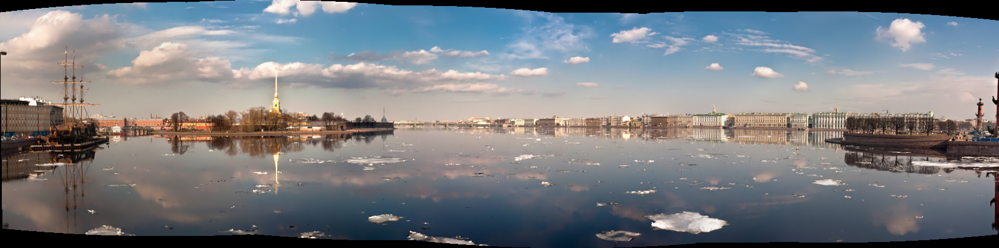

In [ ]:
import cv2
import numpy as np

# def crop_black_borders(image):
#     # Convert image to grayscale
#     gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#     # Create a binary mask where black pixels are 0 and others are 1
#     _, binary_mask = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

#     # Find all non-black pixels
#     coords = cv2.findNonZero(binary_mask)

#     # Get the bounding box of non-black pixels
#     x, y, w, h = cv2.boundingRect(coords)

#     # Crop the image using the bounding box
#     cropped_image = image[y:y+h, x:x+w]

#     return cropped_image

def crop_black_borders(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Threshold to create a binary image where black pixels are 0 and all others are 255
    _, binary_mask = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

    # Find the first non-black pixel from the top
    top = 0
    while top < binary_mask.shape[0] and np.sum(binary_mask[top, :]) == 0:
        top += 1

    # Find the first non-black pixel from the bottom
    bottom = binary_mask.shape[0] - 1
    while bottom >= 0 and np.sum(binary_mask[bottom, :]) == 0:
        bottom -= 1

    # Find the first non-black pixel from the left
    left = 0
    while left < binary_mask.shape[1] and np.sum(binary_mask[:, left]) == 0:
        left += 1

    # Find the first non-black pixel from the right
    right = binary_mask.shape[1] - 1
    while right >= 0 and np.sum(binary_mask[:, right]) == 0:
        right -= 1

    # Crop the image using the identified boundaries
    cropped_image = image[top:bottom+1, left:right+1]

    return cropped_image


# Load your image
image_path = '/content/cropped_result.png'
image = cv2.imread(image_path)

# Crop black borders
cropped_image = crop_black_borders(image)

# Save or display the cropped image
cv2.imwrite('cropped_image.jpg', cropped_image)
# To display the image use:
cv2_imshow(cropped_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [ ]:
import cv2

# Read the image
img = cv2.imread('/content/cropped_result.png')

# Convert the image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Convert the grayscale image to binary image
_, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

# Find contours
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Assuming there is only one contour, get the bounding rectangle
cnt = contours[0]
x, y, w, h = cv2.boundingRect(cnt)

# Crop the image
crop = img[y:y+h, x:x+w]

# Save the cropped image
cv2.imwrite('sofwinres.png', crop)


True

In [ ]:
color = img = cv2.imread('/content/cropped_result.png', cv2.COLOR_BGR2RGB)


In [ ]:
def crop(image):
    y_nonzero, x_nonzero, _ = np.nonzero(image)
    return image[np.min(y_nonzero):np.max(y_nonzero), np.min(x_nonzero):np.max(x_nonzero)]

crop(color)

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

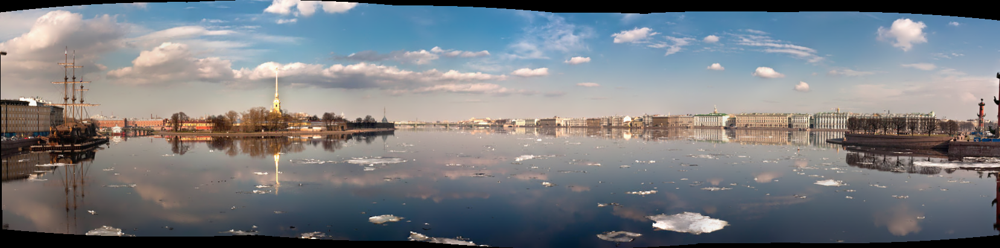

In [ ]:
cv2_imshow(crop(color))
cv2.waitKey(0)
cv2.destroyAllWindows()

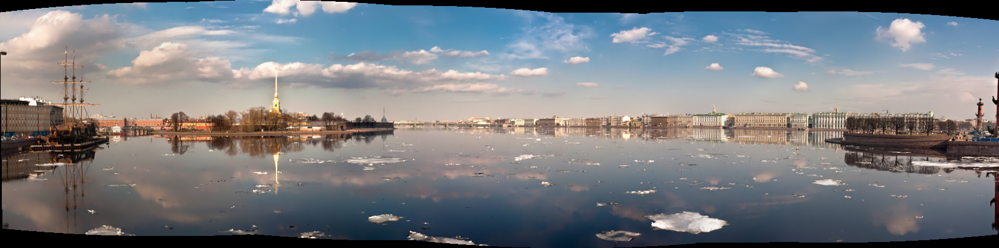

In [ ]:
def trim_opencv(im):
    # sensitivity of the crop
    threshold = 128

    # Converts image to gray and does stuff described above
    gray = cv2.cvtColor(im,cv2.COLOR_BGR2GRAY)
    bg = np.full_like(gray, gray[0,0])
    diff = abs(gray - bg) - threshold
    _,thresh = cv2.threshold(diff,diff[0,0],255,cv2.THRESH_BINARY)

    # finds bounding box and crops
    x,y,w,h = cv2.boundingRect(thresh)
    crop = im[y:y+h,x:x+w]

    return crop

cv2_imshow(trim_opencv(color))
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
import cv2
import numpy as np

def remove_black_columns_rows(img):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Define a threshold to consider a pixel as black
    black_threshold = 10

    # Create a mask where black pixels are marked
    mask = gray < black_threshold

    # Sum the mask for each column and row
    col_sum = np.sum(mask, axis=0)
    row_sum = np.sum(mask, axis=1)

    # Define the threshold for removing a column or row
    col_threshold = mask.shape[0] // 2
    row_threshold = mask.shape[1] // 2

    # Find columns and rows that should be removed
    cols_to_keep = col_sum < col_threshold
    rows_to_keep = row_sum < row_threshold

    # Remove the black columns and rows
    img = img[:, cols_to_keep]
    img = img[rows_to_keep, :]

    return img

# Read the image
img = cv2.imread('/content/cropped_result.png')

# Remove columns and rows with black pixels
processed_img = remove_black_columns_rows(img)

# Save the processed image
cv2.imwrite('processed_image.png', processed_img)


True

In [ ]:
import cv2
import numpy as np

def remove_black_columns_rows(img):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Define a threshold to consider a pixel as black
    black_threshold = 10

    # Create a mask where black pixels are marked
    mask = gray < black_threshold

    # Sum the mask for each column and row
    col_sum = np.sum(mask, axis=0)
    row_sum = np.sum(mask, axis=1)

    # Define the threshold for removing a column or row
    col_threshold = mask.shape[0] // 15
    row_threshold = mask.shape[1] // 15

    # Find columns and rows that should be removed
    cols_to_keep = col_sum < col_threshold
    rows_to_keep = row_sum < row_threshold

    # Remove the black columns and rows
    img = img[:, cols_to_keep]
    img = img[rows_to_keep, :]

    return img

# Read the image
img = cv2.imread('/content/cropped_result.png')

# Remove columns and rows with black pixels
processed_img = remove_black_columns_rows(img)

# Save the processed image
cv2.imwrite('processed_image.png', processed_img)


True

In [ ]:
print(cropped_image.shape)

(412, 1658, 3)


In [ ]:
print(processed_img.shape)

(363, 961, 3)


In [ ]:
import cv2
import numpy as np

def remove_black_columns_rows(img):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Define a threshold to consider a pixel as black
    black_threshold = 10

    # Create a mask where black pixels are marked
    mask = gray < black_threshold

    # Sum the mask for each column and row
    col_sum = np.sum(mask, axis=0)
    row_sum = np.sum(mask, axis=1)

    # Define the threshold for removing a column or row
    col_threshold = mask.shape[0] // 15
    row_threshold = mask.shape[1] // 15

    # Find columns and rows that should be removed
    cols_to_keep = col_sum < col_threshold
    rows_to_keep = row_sum < row_threshold

    # Remove the black columns and rows
    img = img[:, cols_to_keep]
    img = img[rows_to_keep, :]

    return img

# Read the image
img = cv2.imread('/content/cropped_result.png')

# Remove columns and rows with black pixels
processed_img = remove_black_columns_rows(img)

# Save the processed image
cv2.imwrite('processed_image.png', processed_img)


In [ ]:
import cv2
import numpy as np

def remove_black_columns_rows(img, percentage=0.1):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Define a threshold to consider a pixel as black
    black_threshold = 10

    # Create a mask where black pixels are marked
    mask = gray < black_threshold

    # Sum the mask for each column and row
    col_sum = np.sum(mask, axis=0)
    row_sum = np.sum(mask, axis=1)

    # Calculate dynamic thresholds based on image dimensions and percentage
    col_threshold = mask.shape[0] * percentage
    row_threshold = mask.shape[1] * percentage

    # Find columns and rows that should be removed
    cols_to_keep = col_sum < col_threshold
    rows_to_keep = row_sum < row_threshold

    # Remove the black columns and rows
    img = img[:, cols_to_keep]
    img = img[rows_to_keep, :]

    return img

# Read the image
img = cv2.imread('/content/cropped_result.png')

# Remove columns and rows with black pixels
processed_img = remove_black_columns_rows(img, percentage=0.075)

# Save the processed image
cv2.imwrite('processed_image.png', processed_img)


True

In [ ]:
print(processed_img.shape)

(368, 1468, 3)
